#**Segmentation using Canny Edge Detection: UNet-Attention DL Model**

## **Load and Preprocess the dataset**

### **Installation Section**

In [ ]:
!pip install --upgrade tensorflow

### **Importing Libraries**

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import cv2
import gdown
import gc
import shutil
import matplotlib.pyplot as plt
from glob import glob
from google.colab import drive
from scipy.ndimage import rotate
from sklearn.model_selection import train_test_split
from collections import Counter
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Input, Lambda, UpSampling2D, Conv2DTranspose, concatenate, Dropout, BatchNormalization, RandomRotation, RandomFlip, Concatenate, Multiply
from tensorflow.keras.losses import BinaryCrossentropy, Dice,CategoricalFocalCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy,MeanIoU, Precision, Recall, F1Score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model,Sequential

In [ ]:
drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/gdrive


In [ ]:
!ls gdrive/MyDrive/CMP_FACADE

'Base Folder'	    'Extended Folder'   processed_data.7z
 canny_edge_images   models	       'Thesis work.xlsx'


### **Define the directories in your Google Drive**

In [ ]:
parent_dir = '/content/gdrive/MyDrive/CMP_FACADE'

In [ ]:
#!mkdir '/content/gdrive/MyDrive/CMP_FACADE/canny_edge_images'

In [ ]:
edge_dir = parent_dir + '/canny_edge_images'

### **Define the image and label paths**

In [ ]:
!ls '/content/gdrive/MyDrive/CMP_FACADE'

'Base Folder'	    'Extended Folder'   processed_data.7z
 canny_edge_images   models	       'Thesis work.xlsx'


In [ ]:
base_dir = os.path.join(parent_dir,'Base Folder', 'base')
extended_dir = os.path.join(parent_dir,'Extended Folder', 'extended')

# Print the contents of the directories
print("Base directory contents:", os.listdir(base_dir))
print("Extended directory contents:", os.listdir(extended_dir))

base_image_paths = sorted(glob(os.path.join(base_dir, '*.jpg')))
base_label_paths = sorted(glob(os.path.join(base_dir, '*.png')))
extended_image_paths = sorted(glob(os.path.join(extended_dir, '*.jpg')))
extended_label_paths = sorted(glob(os.path.join(extended_dir, '*.png')))

Base directory contents: ['cmp_b0047.png', 'cmp_b0047.xml', 'cmp_b0047.jpg', 'cmp_b0048.xml', 'cmp_b0048.png', 'cmp_b0045.xml', 'cmp_b0046.xml', 'cmp_b0045.jpg', 'cmp_b0046.png', 'cmp_b0055.png', 'cmp_b0053.xml', 'cmp_b0054.jpg', 'cmp_b0050.png', 'cmp_b0050.jpg', 'cmp_b0054.xml', 'cmp_b0052.xml', 'cmp_b0050.xml', 'cmp_b0051.jpg', 'cmp_b0052.jpg', 'cmp_b0053.jpg', 'cmp_b0053.png', 'cmp_b0048.jpg', 'cmp_b0049.png', 'cmp_b0052.png', 'cmp_b0049.jpg', 'cmp_b0051.xml', 'cmp_b0054.png', 'cmp_b0051.png', 'cmp_b0049.xml', 'cmp_b0058.jpg', 'cmp_b0060.jpg', 'cmp_b0061.png', 'cmp_b0060.xml', 'cmp_b0056.jpg', 'cmp_b0058.png', 'cmp_b0059.xml', 'cmp_b0055.jpg', 'cmp_b0057.xml', 'cmp_b0058.xml', 'cmp_b0056.xml', 'cmp_b0056.png', 'cmp_b0055.xml', 'cmp_b0060.png', 'cmp_b0059.jpg', 'cmp_b0057.jpg', 'cmp_b0059.png', 'cmp_b0057.png', 'cmp_b0065.xml', 'cmp_b0064.xml', 'cmp_b0061.xml', 'cmp_b0064.jpg', 'cmp_b0066.xml', 'cmp_b0065.jpg', 'cmp_b0063.xml', 'cmp_b0063.png', 'cmp_b0062.png', 'cmp_b0066.png', 'cmp_

#### Combine the paths from both directories

In [ ]:
image_paths = base_image_paths + extended_image_paths
label_paths = base_label_paths + extended_label_paths

### **Verify the number of images and labels**

In [ ]:
num_images = len(image_paths)
num_labels = len(label_paths)
print(f'Number of images: {num_images}, Number of labels: {num_labels}')

Number of images: 606, Number of labels: 606


### **Function to load and preprocess images and labels**

#### Function to split image into RGB and Canny Edge, Binary Masks

In [ ]:
def rgb_and_canny_image_split(image):
    if image.shape[-1] == 4:
        # Separate RGB and edge channels
        rgb_image = image[:, :, :3]
        edge_image = image[:, :, 3]
        edge_image = np.expand_dims(edge_image, axis=-1)
        edge_image = np.repeat(edge_image, 3, axis=-1)
        # Concatenate RGB and edge images side-by-side
        combined_image = np.concatenate((rgb_image, edge_image), axis=1)
        return combined_image
    else:
        # Return the RGB image if there is no edge channel
        return image

In [ ]:
# def save_as_canny_image(image,image_path, destination):
#     # Split image into RGB and Canny edge
#     combined_image = rgb_and_canny_image_split(image)

#     # Extract filename from source location
#     filename = os.path.basename(image_path)[:-4]+"_with_canny.png"

#     # Save combined image to destination directory
#     cv2.imwrite(os.path.join(destination, filename), combined_image)

In [ ]:
# Global dictionary to store RGB color codes and their corresponding class indices
color_dict = {}
reverse_color_dict = {}
current_class_index = 0
num_classes = 12

In [ ]:
def get_class_from_color(color, sensitivity=0.1):
    global color_dict, reverse_color_dict, current_class_index, num_classes

    # Convert the color to a tuple (since numpy arrays are not hashable)
    color_tuple = tuple(color)

    # Check if a similar color already exists within the sensitivity range
    for existing_color in color_dict.keys():
        diff = np.abs(np.array(existing_color) - np.array(color_tuple))
        if np.all(diff <= (255 * sensitivity / 100)):
            return color_dict[existing_color]

    if color_tuple not in color_dict:
        if current_class_index < num_classes:
            color_dict[color_tuple] = current_class_index
            reverse_color_dict[current_class_index] = color_tuple
            current_class_index += 1
        else:
            raise ValueError("Exceeded the maximum number of classes.")

    return color_dict[color_tuple]

In [ ]:
def rgb_to_binary_masks(label, target_size=(256, 256)):
    # Resize label if necessary
    if label.shape[:2] != target_size:
        label = cv2.resize(label, target_size,interpolation=cv2.INTER_NEAREST)

    # Initialize an array to hold binary masks
    binary_masks = np.zeros((target_size[0], target_size[1], num_classes),dtype=np.uint8)

    # Convert the label image to binary masks
    for i in range(target_size[0]):
        for j in range(target_size[1]):
            color = label[i, j]
            class_index = get_class_from_color(color)
            binary_masks[i, j, class_index] = 1

    return binary_masks.astype(np.uint8)

In [ ]:
def binary_masks_to_rgb(binary_masks):
    # Initialize an array to hold the RGB mask
    target_size = binary_masks.shape[:2]
    rgb_mask = np.zeros((target_size[0], target_size[1], 3), dtype=np.uint8)

    # Convert the binary masks back to an RGB mask
    for i in range(target_size[0]):
        for j in range(target_size[1]):
            for class_index in range(num_classes):
                if (binary_masks[i, j, class_index] == 1).any():
                    rgb_mask[i, j] = reverse_color_dict[class_index]
                    break

    return rgb_mask

In [ ]:
def load_and_preprocess(image_path, label_path, target_size=(256, 256),image_only=False):
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image_size = image.shape[:2]

    if not image_only:
      # Load label
      label = cv2.imread(label_path)
      label = cv2.cvtColor(label, cv2.COLOR_BGR2RGB)

      # Convert label to binary masks
      binary_masks = rgb_to_binary_masks(label, target_size)
    else:
      binary_masks = None
      label = None

    # Apply Canny edge detection and add it as a channel
    edges = cv2.Canny(image, 100, 200)
    image = np.concatenate((image, edges[:, :, np.newaxis]), axis=-1)
    # save_as_canny_image(image,image_path,edge_dir )
    # image = image / 255.0  # Normalize to [0, 1]
    image = image.astype(np.uint8)

    return image, binary_masks, image_size


### **Load and preprocess the entire dataset**

In [ ]:
# # Update the dataset loading loop
# images = []
# binary_masks = []
# sizes = []
# for i,(img_path, lbl_path) in enumerate(zip(image_paths, label_paths)):
#     img, bin_mask, size = load_and_preprocess(img_path, lbl_path,image_only=False)
#     images.append(img)
#     binary_masks.append(bin_mask)
#     sizes.append(size)
#     # if(i == 10):
#     #    break
# images = np.array(images)
# binary_masks = np.array(binary_masks)
# sizes = np.array(sizes)

# print(f"Images shape: {images.shape}")
# print(f"Binary masks shape: {binary_masks.shape}")
# print(f"Sizes shape: {sizes.shape}")
# print(f"Color dictionary: {color_dict}")

In [ ]:
gc.collect()

20

### **Save and load Processed Data**

#### Compressed data

In [ ]:
def save_processed_data(filename, parent_dir=parent_dir):
  """
  Saves processed data (images, binary_masks, sizes, color_dict) to a compressed .7z file.

  Args:
    filename: Name of the .7z file to be created (without extension).
    parent_dir: Directory where the .7z file will be saved.
  """

  # Create a temporary directory to store data before compression
  temp_dir = os.path.join('/content/', 'temp_data')
  os.makedirs(temp_dir, exist_ok=True)

  # Save numpy arrays
  np.save(os.path.join(temp_dir, 'images.npy'), images)
  np.save(os.path.join(temp_dir, 'binary_masks.npy'), binary_masks)
  np.save(os.path.join(temp_dir, 'sizes.npy'), sizes)
  np.save(os.path.join(temp_dir, 'color_dict.npy'), color_dict)

  # Compress the temporary directory into a .7z file
  comp_file = os.path.join('/content/', filename + '.7z')
  to_comp_file = os.path.join('/content/', 'temp_data')
  !7z a "$comp_file" "$to_comp_file" -t7z -mx=9 -y

  #copy compressed file to parent_dir
  shutil.copy(comp_file, parent_dir)

  # Remove the temporary directory
  !rm -r "$temp_dir"

  print(f"Processed data saved to {os.path.join(parent_dir, filename + '.7z')}")


#### Save Processed Data

In [ ]:
# %%time
# save_processed_data('processed_data')

#### Load Processed Data

In [ ]:
def load_processed_data(filename, parent_dir=parent_dir):
  """
  Loads processed data from a compressed .7z file.

  Args:
    filename: Name of the .7z file (without extension).
    parent_dir: Directory containing the .7z file.

  Returns:
    A tuple containing (images, binary_masks, sizes, color_dict).
  """

  # Copy the .7z file to /content/
  source_file = os.path.join(parent_dir, filename + '.7z')
  destination_file = os.path.join('/content/', filename + '.7z')
  shutil.copy(source_file, destination_file)

  # Extract the .7z file locally in /content/
  ext_file = destination_file
  to_dir = os.path.join('/content/', 'extracted_data')
  !7z e "$ext_file" -o"$to_dir" -y

  # Load numpy arrays
  global images, binary_masks, sizes, color_dict,reverse_color_dict
  images = np.load(os.path.join(to_dir, 'images.npy'))
  binary_masks = np.load(os.path.join(to_dir, 'binary_masks.npy'))
  sizes = np.load(os.path.join(to_dir, 'sizes.npy'))
  color_dict = np.load(os.path.join(to_dir, 'color_dict.npy'), allow_pickle=True).item()  # Load color_dict as a dictionary
  reverse_color_dict = {v: k for k, v in color_dict.items()}

  # Remove the extracted data directory and the copied .7z file
  !rm -r "$to_dir"
  !rm "$destination_file"

  print("Processed data loaded.")
  return images, binary_masks, sizes, color_dict,reverse_color_dict


In [ ]:
%%time
load_processed_data('processed_data')


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/                   1 file, 70056626 bytes (67 MiB)

Extracting archive: /content/processed_data.7z
--
Path = /content/processed_data.7z
Type = 7z
Physical Size = 70056626
Headers Size = 264
Method = LZMA2:26
Solid = +
Blocks = 1

  0%      9% 1 - temp_data/binary_masks.npy                                    21% 1 - temp_data/binary_masks.npy                                    33% 1 - temp_data/binary_masks.npy                                    45% 1 - temp_data/binary_masks.npy

(array([[[[190, 204, 217,   0],
          [190, 204, 217,   0],
          [190, 204, 217,   0],
          ...,
          [212, 219, 229,   0],
          [211, 218, 228,   0],
          [212, 219, 229,   0]],
 
         [[190, 204, 217,   0],
          [190, 204, 217,   0],
          [190, 204, 217,   0],
          ...,
          [212, 219, 229,   0],
          [211, 218, 228,   0],
          [212, 219, 229,   0]],
 
         [[191, 205, 218,   0],
          [191, 205, 218,   0],
          [191, 205, 218,   0],
          ...,
          [214, 221, 231,   0],
          [214, 221, 231,   0],
          [214, 221, 231,   0]],
 
         ...,
 
         [[ 44,  41,  35, 255],
          [ 44,  41,  35, 255],
          [ 44,  41,  35, 255],
          ...,
          [ 24,   7,   4, 255],
          [ 20,   5,   2,   0],
          [ 15,   4,   0,   0]],
 
         [[ 91,  88,  82,   0],
          [ 91,  88,  82,   0],
          [ 96,  93,  87,   0],
          ...,
          [ 11,  10,   6,   0],
 

In [ ]:
#  image = image / 255.0  # Normalize to [0, 1]

In [ ]:
print(f"Images shape: {images.shape}")
print(f"Binary masks shape: {binary_masks.shape}")
print(f"Sizes shape: {sizes.shape}")
print(f"Color dictionary: {color_dict}")
print(f"Reverse Color dictionary: {reverse_color_dict}")

Images shape: (606, 256, 256, 4)
Binary masks shape: (606, 256, 256, 12)
Sizes shape: (606, 2)
Color dictionary: {(0, 0, 170): 0, (0, 0, 255): 1, (0, 255, 255): 2, (0, 85, 255): 3, (255, 255, 0): 4, (85, 255, 170): 5, (255, 170, 0): 6, (170, 255, 85): 7, (255, 85, 0): 8, (255, 0, 0): 9, (0, 170, 255): 10, (170, 0, 0): 11}
Reverse Color dictionary: {0: (0, 0, 170), 1: (0, 0, 255), 2: (0, 255, 255), 3: (0, 85, 255), 4: (255, 255, 0), 5: (85, 255, 170), 6: (255, 170, 0), 7: (170, 255, 85), 8: (255, 85, 0), 9: (255, 0, 0), 10: (0, 170, 255), 11: (170, 0, 0)}


In [ ]:
print(color_dict)

{(0, 0, 170): 0, (0, 0, 255): 1, (0, 255, 255): 2, (0, 85, 255): 3, (255, 255, 0): 4, (85, 255, 170): 5, (255, 170, 0): 6, (170, 255, 85): 7, (255, 85, 0): 8, (255, 0, 0): 9, (0, 170, 255): 10, (170, 0, 0): 11}


### **Load and Check Class Imbalance**

In [ ]:
bgr_color_codes = {
  "background": (170, 0, 0),
  "facade": (255, 0, 0),
  "window": (255, 85, 0),
  "door": (255, 170, 0),
  "cornice": (170, 255, 85),
  "sill": (0, 170, 255),
  "balcony": (85, 255, 170),
  "blind": (0, 255, 255),
  "deco": (255, 255, 0),
  "molding": (0, 85, 255),
  "pillar": (0, 0, 255),
  "shop": (0, 0, 170)
}

In [ ]:
rgb_color_codes = {}
for key, bgr_color in bgr_color_codes.items():
    rgb_color = (bgr_color[2], bgr_color[1], bgr_color[0])
    rgb_color_codes[key] = rgb_color

rgb_color_codes

{'background': (0, 0, 170),
 'facade': (0, 0, 255),
 'window': (0, 85, 255),
 'door': (0, 170, 255),
 'cornice': (85, 255, 170),
 'sill': (255, 170, 0),
 'balcony': (170, 255, 85),
 'blind': (255, 255, 0),
 'deco': (0, 255, 255),
 'molding': (255, 85, 0),
 'pillar': (255, 0, 0),
 'shop': (170, 0, 0)}

In [ ]:
print(color_dict)

{(0, 0, 170): 0, (0, 0, 255): 1, (0, 255, 255): 2, (0, 85, 255): 3, (255, 255, 0): 4, (85, 255, 170): 5, (255, 170, 0): 6, (170, 255, 85): 7, (255, 85, 0): 8, (255, 0, 0): 9, (0, 170, 255): 10, (170, 0, 0): 11}


In [ ]:
def check_class_imbalance(binary_masks):
  class_counts = Counter()
  for mask in binary_masks:
    for class_index in range(mask.shape[-1]):
      if np.any(mask[:,:,class_index]):
        class_counts[class_index] += 1
  # Plot the class counts
  plt.figure(figsize=(10, 5))
  # Get class names from rgb_color_codes and sort them by index
  class_names = [key for key, value in sorted(rgb_color_codes.items(), key=lambda item: get_class_from_color(item[1]))]
  plt.bar(class_names, [class_counts[i] for i in range(len(class_names))])  # Use class names for x-axis labels
  plt.xlabel("Class")
  plt.ylabel("Count")
  plt.title("Class Imbalance")
  plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
  plt.tight_layout()  # Adjust layout to prevent labels from overlapping
  plt.show()
  return class_counts


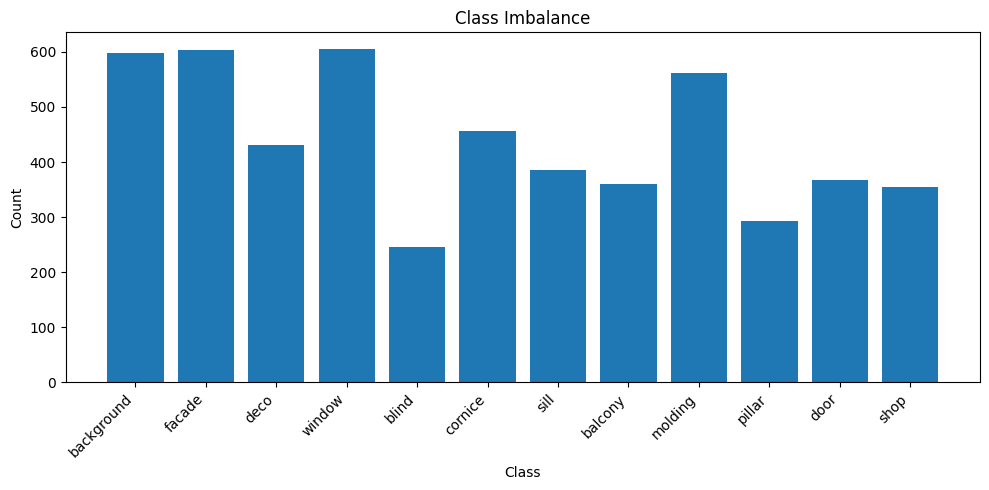

Counter({0: 597,
         1: 604,
         2: 430,
         3: 605,
         4: 246,
         5: 457,
         6: 385,
         7: 360,
         8: 561,
         9: 293,
         10: 367,
         11: 355})

In [ ]:
check_class_imbalance(binary_masks)

### **Data Augmentation & Split the dataset into training and validation sets**

In [ ]:
class CustomImageGenerator(tf.keras.utils.Sequence):
    def __init__(self, X, y,augmented=True, batch_size=32):
        super().__init__()
        self.X = X
        self.y = y
        self.augmented = augmented
        self.batch_size = batch_size
        self.indices = np.arange(len(X))
        self.random_model = self.create_random_model()

    def create_random_model(self):
        input_tensor_1 = Input(shape=(256, 256, 4))
        input_tensor_2 = Input(shape=(256, 256, 12))

        # Concatenate the inputs
        merged_tensor = Concatenate(axis=-1)([input_tensor_1, input_tensor_2])

        # Apply random transformations
        rotated_tensor = RandomRotation(factor=(-0.06, 0.06), fill_mode='constant')(merged_tensor)
        flipped_tensor = RandomFlip(mode='horizontal')(rotated_tensor)

        # Split the tensors back
        output_tensor_1 = Lambda(lambda x: x[:,:,:,:4])(flipped_tensor)
        output_tensor_2 = Lambda(lambda x: x[:,:,:,4:])(flipped_tensor)

        # Create the model
        model = Model(inputs=[input_tensor_1, input_tensor_2], outputs=[output_tensor_1, output_tensor_2])
        return model

    def __len__(self):
        return len(self.X) // self.batch_size

    def __getitem__(self, index):
        # Get batch of data
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]
        X_batch = self.X[indices].astype(np.float32)
        y_batch = self.y[indices].astype(np.float32)

        # Apply same random augmentations to both X and y
        if self.augmented:
            X_batch, y_batch = self.augment(X_batch, y_batch)

        return X_batch, y_batch

    def augment(self, X, y):
        X,y = self.random_model([X,y],training=True)
        return X.numpy(),y.numpy()

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(images,binary_masks, test_size=0.2, random_state=42)

In [ ]:
# Assuming X and y are your image data
train_generator = CustomImageGenerator(X_train, y_train, batch_size=16)
validation_generator = CustomImageGenerator(X_val, y_val, augmented=False, batch_size=16)

In [ ]:
len(train_generator)

30

In [ ]:
len(validation_generator)

7

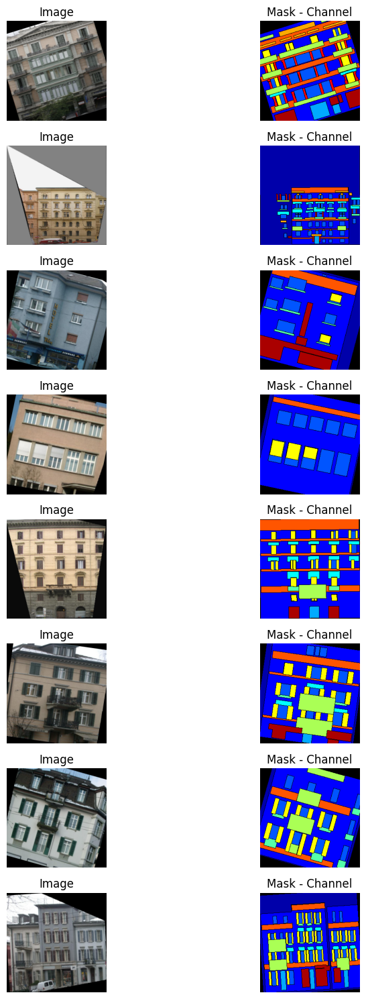

In [ ]:
# Get a batch of data from the generator
X_batch, y_batch = train_generator.__getitem__(0)  # Get the first batch
X_batch = X_batch.astype(np.uint8)
y_batch = y_batch.astype(np.uint8)

# Select a few sample images to display (adjust the number as needed)
num_samples = 8

# Display the images and their corresponding masks
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 15))

for i in range(num_samples):
    # Display original image
    image = X_batch[i]  # Assuming images are normalized to [0, 1]
    axes[i, 0].imshow(image[:, :, :3])  # Display only the RGB part (left half)
    axes[i, 0].set_title("Image")
    axes[i, 0].axis('off')

    # Display masks (one channel at a time)
    mask =binary_masks_to_rgb(y_batch[i])
    axes[i, 1].imshow(mask, cmap='gray')
    axes[i, 1].set_title(f"Mask - Channel")
    axes[i, 1].axis('off')


plt.tight_layout()
plt.show()


In [ ]:
%timeit X_batch, y_batch = train_generator.__getitem__(0)

235 ms ± 8.94 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
y_train.shape

(484, 256, 256, 12)

In [ ]:
print(f'Training set size: {X_train.shape[0]}, Validation set size: {X_val.shape[0]}')

Training set size: 484, Validation set size: 122


## **Define UNet Model**

### Model definition

In [ ]:
class UNetModel(keras.Model):
  def __init__(self, input_shape=(256, 256, 4), **kwargs):
    super(UNetModel, self).__init__(**kwargs)
    self._input_shape = input_shape

  def build(self,input_shape):
    input_shape = input_shape or self._input_shape
    self.input_shape = input_shape
    self.inputs = Input(self.input_shape, name='inputs')
    current_shape = (None, *input_shape)
    self.normalized_inputs = Lambda(lambda x: x / 255.0, name='normalized_inputs')
    self.normalized_inputs.build(current_shape)
    current_shape = self.normalized_inputs.compute_output_shape(current_shape)

    self.conv1 = self.conv_block(64, name_prefix='block1')
    self.conv1.build(current_shape)
    current_shape = self.conv1.compute_output_shape(current_shape)
    self.pool1 = MaxPooling2D(pool_size=(2, 2), name='pool1')
    self.pool1.build(current_shape)
    current_shape = self.pool1.compute_output_shape(current_shape)

    self.conv2 = self.conv_block(128, name_prefix='block2')
    self.conv2.build(current_shape)
    current_shape = self.conv2.compute_output_shape(current_shape)
    self.pool2 = MaxPooling2D(pool_size=(2, 2), name='pool2')
    self.pool2.build(current_shape)
    current_shape = self.pool2.compute_output_shape(current_shape)

    self.conv3 = self.conv_block(256, name_prefix='block3')
    self.conv3.build(current_shape)
    current_shape = self.conv3.compute_output_shape(current_shape)
    self.pool3 = MaxPooling2D(pool_size=(2, 2), name='pool3')
    self.pool3.build(current_shape)
    current_shape = self.pool3.compute_output_shape(current_shape)

    self.conv4 = self.conv_block(512, name_prefix='block4')
    self.conv4.build(current_shape)
    current_shape = self.conv4.compute_output_shape(current_shape)
    self.pool4 = MaxPooling2D(pool_size=(2, 2), name='pool4')
    self.pool4.build(current_shape)
    current_shape = self.pool4.compute_output_shape(current_shape)

    self.conv5 = self.conv_block(1024, name_prefix='block5')
    self.conv5.build(current_shape)
    current_shape = self.conv5.compute_output_shape(current_shape)

    self.up6 = self.up_attention_block(self.conv5, self.conv4, 512, name_prefix='up6')
    self.up6.build([current_shape, self.conv4.output_shape])
    current_shape = self.up6.compute_output_shape([current_shape, self.conv4.output_shape])
    self.up7 = self.up_attention_block(self.up6, self.conv3, 256, name_prefix='up7')
    self.up7.build([current_shape, self.conv3.output_shape])
    current_shape = self.up7.compute_output_shape([current_shape, self.conv3.output_shape])
    self.up8 = self.up_attention_block(self.up7, self.conv2, 128, name_prefix='up8')
    self.up8.build([current_shape, self.conv2.output_shape])
    current_shape = self.up8.compute_output_shape([current_shape, self.conv2.output_shape])
    self.up9 = self.up_attention_block(self.up8, self.conv1, 64, name_prefix='up9')
    self.up9.build([current_shape, self.conv1.output_shape])
    current_shape = self.up9.compute_output_shape([current_shape, self.conv1.output_shape])

    self.conv9 = Conv2D(16, 3, padding='same', name='conv_output_9_3')
    self.conv9.build(current_shape)
    current_shape = self.conv9.compute_output_shape(current_shape)
    self.outputs = Conv2D(12, 3, activation='softmax', padding='same', name='outputs')
    self.outputs.build(current_shape)
    current_shape = self.outputs.compute_output_shape(current_shape)

  def compute_output_shape(self, input_shape):
    return (*input_shape[:-1],12)

  @property
  def output_shape(self):
    return self.compute_output_shape(self._input_shape)

  def conv_block(self, filters, kernel_size=3, padding='same', activation='relu', name_prefix=''):
    x=Sequential([Conv2D(filters, kernel_size, padding=padding, name=f'{name_prefix}_conv1'),
    BatchNormalization(name=f'{name_prefix}_bn1'),
    Activation(activation, name=f'{name_prefix}_act1'),
    Conv2D(filters, kernel_size, padding=padding, name=f'{name_prefix}_conv2'),
    BatchNormalization(name=f'{name_prefix}_bn2'),
    Activation(activation, name=f'{name_prefix}_act2')])
    return x

  def up_attention_block(self, prev_tensor, skip_tensor, filters, kernel_size=3, padding='same', activation='relu', name_prefix=''):
    input_1 = Input(shape=prev_tensor.output_shape[1:], name=f'{name_prefix}_input1')
    input_2 = Input(shape=skip_tensor.output_shape[1:], name=f'{name_prefix}_input2')
    ix = UpSampling2D(size=(2, 2), name=f'{name_prefix}_up1')( input_1 )
    x = Conv2DTranspose(filters, kernel_size, padding=padding, name=f'{name_prefix}_up2')(ix)
    x = BatchNormalization(name=f'{name_prefix}_bn1')(x)
    x = Activation(activation, name=f'{name_prefix}_act1')(x)

    # Attention Mechanism
    attention = Conv2D(1, (1, 1), activation='sigmoid', name=f'{name_prefix}_attention')(input_2)
    x = Multiply(name=f'{name_prefix}_attention_multiply')([x, attention])

    x = concatenate([input_2, x], axis=-1, name=f'{name_prefix}_merge')
    x = Conv2DTranspose(filters, kernel_size, padding=padding, name=f'{name_prefix}_conv1')(x)
    x = BatchNormalization(name=f'{name_prefix}_bn2')(x)
    x = Activation(activation, name=f'{name_prefix}_act2')(x)
    x = Conv2DTranspose(filters, kernel_size, padding=padding, name=f'{name_prefix}_conv2')(x)
    x = BatchNormalization(name=f'{name_prefix}_bn3')(x)
    x = Activation(activation, name=f'{name_prefix}_act3')(x)
    return Model(inputs=(input_1,input_2), outputs=x)

  def call(self, inputs):
    x_0 = self.normalized_inputs(inputs)
    x_1 = self.conv1(x_0)
    x_2 = self.pool1(x_1)
    x_3 = self.conv2(x_2)
    x_4 = self.pool2(x_3)
    x_5 = self.conv3(x_4)
    x_6 = self.pool3(x_5)
    x_7 = self.conv4(x_6)
    x_8 = self.pool4(x_7)
    x_9 = self.conv5(x_8)
    x_10 = self.up6((x_9,x_7))
    x_11 = self.up7((x_10,x_5))
    x_12 = self.up8((x_11,x_3))
    x_13 = self.up9((x_12,x_1))
    x_14 = self.conv9(x_13)
    x_15 = self.outputs(x_14)
    return x_15

  def build_graph(self):
        inp_shp_1 = self._input_shape

        inp_1 = Input(shape=inp_shp_1, dtype=self.dtype)

        out = self.call(inp_1)

        inps = [inp_1]

        graph = Model(inputs=inps, outputs=[out])
        self._output_shape = out.shape
        return graph

  def plot_model(self, to_file='model.png', show_shapes=True, show_dtype=False, show_layer_names=True, rankdir='TB', expand_nested=True, dpi=200, show_layer_activations=True, show_trainable=True, force=False, **kwargs):
        return plot_model(self.get_graph(force=force), to_file=to_file, show_shapes=show_shapes, show_layer_names=show_layer_names, rankdir=rankdir, expand_nested=expand_nested, dpi=dpi, show_layer_activations=show_layer_activations, show_trainable=show_trainable, **kwargs)

  def get_graph(self, force=False):
        return self.build_graph()


## **Create the model**

In [ ]:
unet_model = UNetModel()
unet_model.build((256,256,4))
unet_model.summary()

Model: "u_net_model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ normalized_inputs (Lambda)           │ (None, 256, 256, 4)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_5 (Sequential)            │ (None, 256, 256, 64)        │          39,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool1 (MaxPooling2D)                 │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_6 (Sequential)            │ (None, 128, 128, 128)       │         222,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool2 (MaxPooling2D)                 │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_7 (Sequential)            │ (None, 64, 64, 256)         │         887,296 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool3 (MaxPooling2D)                 │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_8 (Sequential)            │ (None, 32, 32, 512)         │       3,544,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool4 (MaxPooling2D)                 │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_9 (Sequential)            │ (None, 16, 16, 1024)        │      14,166,016 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_20 (Functional)           │ (None, 32, 32, 512)         │      11,804,673 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_21 (Functional)           │ (None, 64, 64, 256)         │       2,953,217 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_22 (Functional)           │ (None, 128, 128, 128)       │         739,329 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_23 (Functional)           │ (None, 256, 256, 64)        │         185,345 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_output_9_3 (Conv2D)             │ (None, 256, 256, 16)        │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ outputs (Conv2D)                     │ (None, 256, 256, 12)        │           1,740 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,553,184 (131.81 MB)

 Trainable params: 34,539,488 (131.76 MB)

 Non-trainable params: 13,696 (53.50 KB)

In [ ]:
unet_model.plot_model(show_shapes=True, show_layer_activations=True,show_trainable=True,show_layer_names=True,expand_nested=True )

In [ ]:
random_model = Sequential([
    Input(shape=(256,256,4)),
    RandomRotation(factor=(-0.06,0.06), fill_mode='constant', name='random_rotation'),
    RandomFlip(mode='horizontal', name='random_flip')
])
random_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_rotation (RandomRotation)     │ (None, 256, 256, 4)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 256, 256, 4)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def create_random_model():
    input_tensor_1 = Input(shape=(256, 256, 4))
    input_tensor_2 = Input(shape=(256, 256, 12))

    # Concatenate the inputs
    merged_tensor = Concatenate(axis=-1)([input_tensor_1, input_tensor_2])

    # Apply random transformations
    rotated_tensor = RandomRotation(factor=(-0.06, 0.06), fill_mode='constant')(merged_tensor)
    flipped_tensor = RandomFlip(mode='horizontal')(rotated_tensor)

    # Split the tensors back
    output_tensor_1 = Lambda(lambda x: x[:,:,:,:4])(flipped_tensor)
    output_tensor_2 = Lambda(lambda x: x[:,:,:,4:])(flipped_tensor)

    # Create the model
    model = Model(inputs=[input_tensor_1, input_tensor_2], outputs=[output_tensor_1, output_tensor_2])
    return model

functional_random_model = create_random_model()
functional_random_model.summary()


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 256, 256, 4)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_12            │ (None, 256, 256, 12)   │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 256, 256, 16)   │              0 │ input_layer_11[0][0],  │
│ (Concatenate)             │                        │                │ input_layer_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_rotation_2         │ (None, 256, 256, 16)   │              0 │ concatenate_2[0][0]    │
│ (RandomRotation)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_flip_2             │ (None, 256, 256, 16)   │              0 │ random_rotation_2[0][… │
│ (RandomFlip)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_4 (Lambda)         │ (None, 256, 256, 4)    │              0 │ random_flip_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_5 (Lambda)         │ (None, 256, 256, 12)   │              0 │ random_flip_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

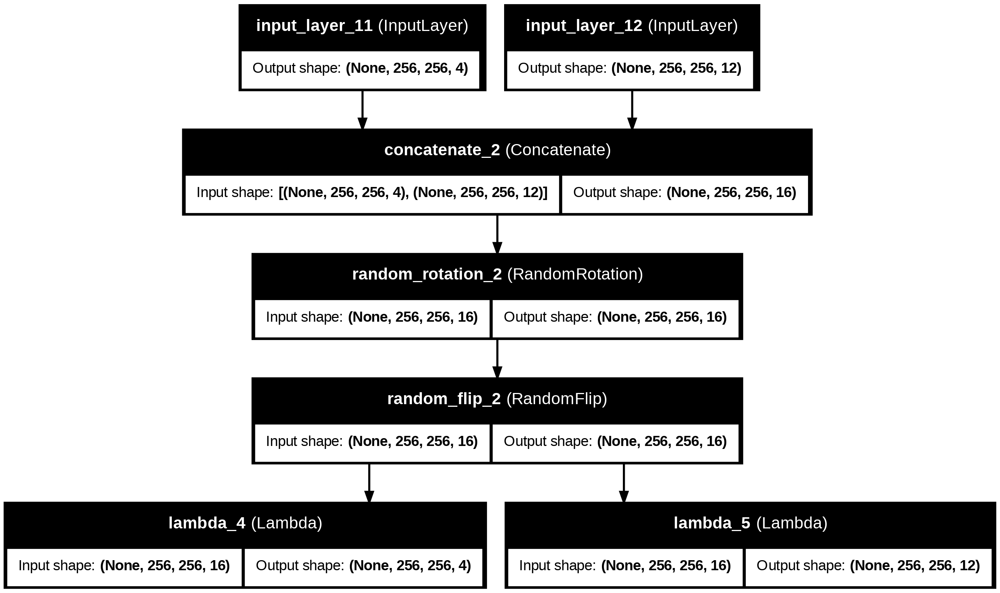

In [ ]:
plot_model(functional_random_model, show_shapes=True, show_layer_activations=True,show_trainable=True,show_layer_names=True,expand_nested=True )

In [ ]:
model = Sequential([
    Input(shape=(256,256,4)),
    random_model,
    unet_model
])

In [ ]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_5 (Sequential)            │ (None, 256, 256, 4)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ u_net_model (UNetModel)              │ (None, 256, 256, 12)        │      34,553,184 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,553,184 (131.81 MB)

 Trainable params: 34,539,488 (131.76 MB)

 Non-trainable params: 13,696 (53.50 KB)

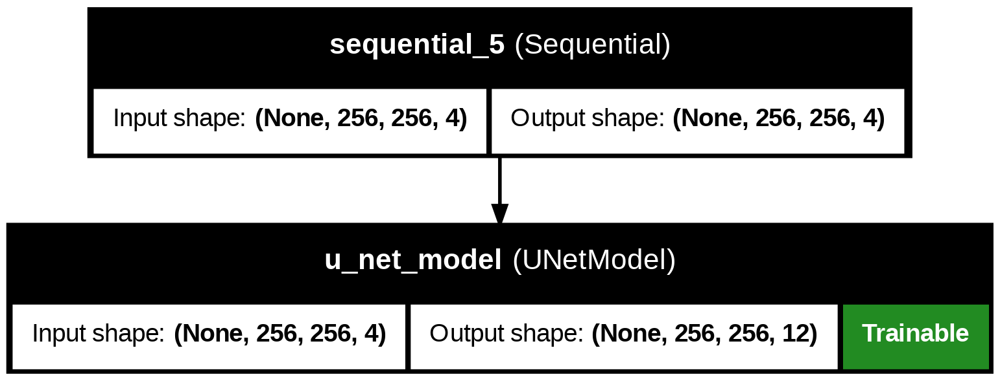

In [ ]:
plot_model(model, show_shapes=True, show_layer_activations=True,show_trainable=True,show_layer_names=True,expand_nested=True )

## **Metrics for Evaluation**

In [ ]:
# Define the subset of class indices we want to calculate mIoU for
selected_class_indices = [2, 5, 6, 9, 10]

@tf.function(jit_compile=True)
def calculate_miou(y_true, y_pred):
    # Ensure y_pred is in the correct shape (batch, height, width, classes)
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.argmax(y_true, axis=-1)

    # Initialize lists to store IoU for each selected class
    iou_scores = []

    for class_index in selected_class_indices:
        # Calculate intersection
        intersection = tf.reduce_sum(tf.cast((y_pred == class_index) & (y_true == class_index), tf.float32))
        # Calculate union
        union = tf.reduce_sum(tf.cast((y_pred == class_index) | (y_true == class_index), tf.float32))
        # Calculate IoU and handle division by zero
        iou = tf.math.divide_no_nan(intersection, union)
        iou_scores.append(iou)

    # Calculate mean of IoU scores for the selected classes
    miou = tf.reduce_mean(iou_scores)
    return miou

In [ ]:
@tf.function(jit_compile=True)
def calculate_precision(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.argmax(y_true, axis=-1)

    precisions = []
    for class_index in selected_class_indices:
        true_positive = tf.reduce_sum(tf.cast((y_pred == class_index) & (y_true == class_index), tf.float32))
        predicted_positive = tf.reduce_sum(tf.cast(y_pred == class_index, tf.float32))
        precision = tf.math.divide_no_nan(true_positive, predicted_positive)
        precisions.append(precision)

    return tf.reduce_mean(precisions)

@tf.function(jit_compile=True)
def calculate_recall(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.argmax(y_true, axis=-1)

    recalls = []
    for class_index in selected_class_indices:
        true_positive = tf.reduce_sum(tf.cast((y_pred == class_index) & (y_true == class_index), tf.float32))
        actual_positive = tf.reduce_sum(tf.cast(y_true == class_index, tf.float32))
        recall = tf.math.divide_no_nan(true_positive, actual_positive)
        recalls.append(recall)

    return tf.reduce_mean(recalls)

@tf.function(jit_compile=True)
def calculate_f1_score(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.argmax(y_true, axis=-1)

    f1_scores = []
    for class_index in selected_class_indices:
        true_positive = tf.reduce_sum(tf.cast((y_pred == class_index) & (y_true == class_index), tf.float32))
        predicted_positive = tf.reduce_sum(tf.cast(y_pred == class_index, tf.float32))
        actual_positive = tf.reduce_sum(tf.cast(y_true == class_index, tf.float32))

        precision = tf.math.divide_no_nan(true_positive, predicted_positive)
        recall = tf.math.divide_no_nan(true_positive, actual_positive)
        f1 = tf.math.divide_no_nan(2 * precision * recall, precision + recall)
        f1_scores.append(f1)

    return tf.reduce_mean(f1_scores)


## **Compile the Model**

### Losses

In [ ]:
loss = CategoricalFocalCrossentropy(name='model_focal_loss')

### Metrics

In [ ]:
metrics = [BinaryAccuracy(threshold=0.8, name='model_accuracy'),calculate_miou, calculate_precision, calculate_recall, calculate_f1_score]

### Compile

In [ ]:
unet_model.compile(optimizer=Adam(learning_rate=1e-4,clipvalue=1.0), loss=loss, metrics=metrics)

## **Train the Model**

### **Fit 1**

In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 145s 1s/step - loss: 0.4396 - model_accuracy: 0.9153 - model_miou_score: 0.2953 - val_loss: 0.3730 - val_model_accuracy: 0.9167 - val_model_miou_score: 0.3478
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - loss: 0.3359 - model_accuracy: 0.9151 - model_miou_score: 0.2954 - val_loss: 0.3568 - val_model_accuracy: 0.9167 - val_model_miou_score: 0.3478
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.3235 - model_accuracy: 0.9149 - model_miou_score: 0.2948 - val_loss: 0.3342 - val_model_accuracy: 0.9167 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - loss: 0.3107 - model_accuracy: 0.9153 - model_miou_score: 0.2953 - val_loss: 0.3188 - val_model_accuracy: 0.9167 - val_model_miou_score: 0.3478
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - loss: 0.3028 - model_accuracy: 0.9150 - model_miou_score: 0.2952 - val_loss: 0.3185 - val_model_accuracy: 0.9167 - val_model_miou_score: 0.3478
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model1.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.398460,0.915315,0.25,0.372996,0.916667,0.347826
1,0.335178,0.915338,0.25,0.356774,0.916667,0.347826
2,0.325709,0.915038,0.25,0.334246,0.916667,0.347826
3,0.310000,0.915359,0.25,0.318812,0.916667,0.347826
4,0.300226,0.915252,0.25,0.318483,0.916667,0.347826


<Axes: >

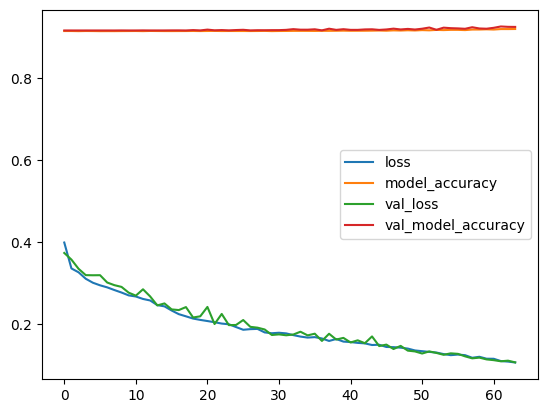

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()


### **Fit 2**

In [ ]:
n=1
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - loss: 0.1115 - model_accuracy: 0.9209 - model_miou_score: 0.2949 - val_loss: 0.1053 - val_model_accuracy: 0.9239 - val_model_miou_score: 0.3478
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - loss: 0.0987 - model_accuracy: 0.9208 - model_miou_score: 0.2954 - val_loss: 0.0992 - val_model_accuracy: 0.9285 - val_model_miou_score: 0.3478
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - loss: 0.0991 - model_accuracy: 0.9226 - model_miou_score: 0.2952 - val_loss: 0.0998 - val_model_accuracy: 0.9287 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - loss: 0.0937 - model_accuracy: 0.9223 - model_miou_score: 0.2950 - val_loss: 0.1013 - val_model_accuracy: 0.9319 - val_model_miou_score: 0.3478
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - loss: 0.0975 - model_accuracy: 0.9227 - model_miou_score: 0.2952 - val_loss: 0.0958 - val_model_accuracy: 0.9286 - val_model_miou_score: 0.3478
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model2.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.108106,0.920938,0.25,0.105314,0.923920,0.347826
1,0.098799,0.921476,0.25,0.099239,0.928482,0.347826
2,0.096708,0.922208,0.25,0.099753,0.928745,0.347826
3,0.094817,0.922109,0.25,0.101256,0.931922,0.347826
4,0.095273,0.922504,0.25,0.095850,0.928623,0.347826


<Axes: >

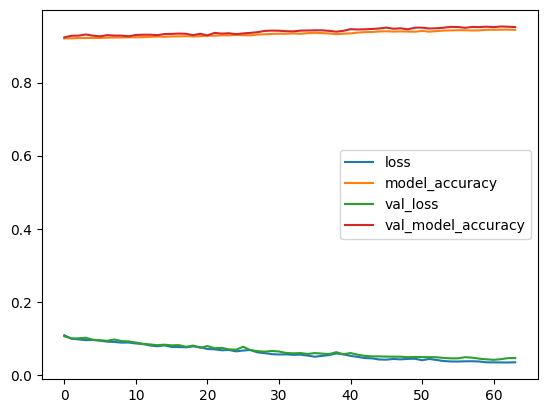

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

### **Fit 3**

In [ ]:
n=2
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - loss: 0.0455 - model_accuracy: 0.9398 - model_miou_score: 0.2951 - val_loss: 0.0453 - val_model_accuracy: 0.9532 - val_model_miou_score: 0.3478
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - loss: 0.0342 - model_accuracy: 0.9448 - model_miou_score: 0.2951 - val_loss: 0.0410 - val_model_accuracy: 0.9537 - val_model_miou_score: 0.3478
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.0315 - model_accuracy: 0.9462 - model_miou_score: 0.2951 - val_loss: 0.0394 - val_model_accuracy: 0.9541 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.0307 - model_accuracy: 0.9462 - model_miou_score: 0.2953 - val_loss: 0.0416 - val_model_accuracy: 0.9535 - val_model_miou_score: 0.3478
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.0313 - model_accuracy: 0.9466 - model_miou_score: 0.2949 - val_loss: 0.0410 - val_model_accuracy: 0.9548 - val_model_miou_score: 0.3478
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model3.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.042001,0.940549,0.250007,0.045263,0.953203,0.347826
1,0.033780,0.944875,0.250000,0.040953,0.953687,0.347826
2,0.031727,0.946164,0.250000,0.039429,0.954064,0.347826
3,0.031081,0.946601,0.250000,0.041623,0.953501,0.347826
4,0.031476,0.946346,0.250000,0.040987,0.954752,0.347826


<Axes: >

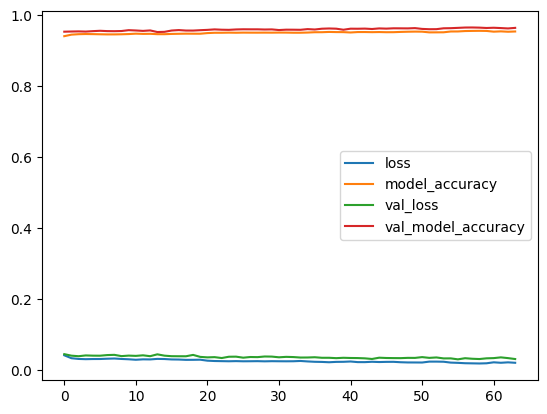

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()


### **Fit 4**

In [ ]:
n=3
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 147s 1s/step - loss: 0.0249 - model_accuracy: 0.9511 - model_miou_score: 0.2954 - val_loss: 0.0329 - val_model_accuracy: 0.9640 - val_model_miou_score: 0.3478
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - loss: 0.0211 - model_accuracy: 0.9538 - model_miou_score: 0.2955 - val_loss: 0.0323 - val_model_accuracy: 0.9639 - val_model_miou_score: 0.3478
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - loss: 0.0209 - model_accuracy: 0.9529 - model_miou_score: 0.2956 - val_loss: 0.0315 - val_model_accuracy: 0.9647 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - loss: 0.0189 - model_accuracy: 0.9557 - model_miou_score: 0.2950 - val_loss: 0.0328 - val_model_accuracy: 0.9645 - val_model_miou_score: 0.3478
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - loss: 0.0205 - model_accuracy: 0.9543 - model_miou_score: 0.2952 - val_loss: 0.0332 - val_model_accuracy: 0.9650 - val_model_miou_score: 0.3478
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model4.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.023461,0.951882,0.250014,0.032907,0.964015,0.347826
1,0.020598,0.954010,0.250027,0.032271,0.963862,0.347826
2,0.019957,0.954664,0.250000,0.031546,0.964741,0.347826
3,0.019872,0.954935,0.250009,0.032770,0.964510,0.347826
4,0.020145,0.954706,0.250005,0.033225,0.965033,0.347840


<Axes: >

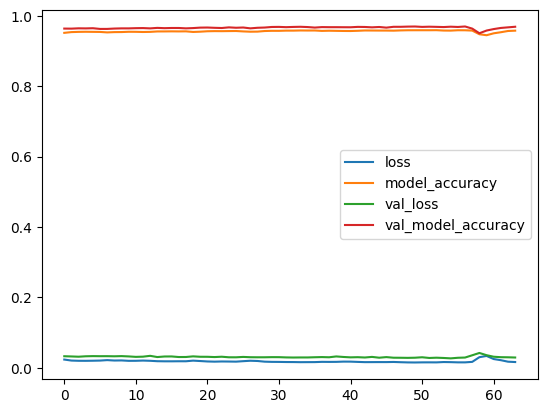

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()


### **Fit 5**

In [ ]:
n=4
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - loss: 0.0189 - model_accuracy: 0.9573 - model_miou_score: 0.2948 - val_loss: 0.0297 - val_model_accuracy: 0.9692 - val_model_miou_score: 0.3478
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - loss: 0.0166 - model_accuracy: 0.9579 - model_miou_score: 0.2953 - val_loss: 0.0290 - val_model_accuracy: 0.9691 - val_model_miou_score: 0.3479
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - loss: 0.0151 - model_accuracy: 0.9592 - model_miou_score: 0.2952 - val_loss: 0.0294 - val_model_accuracy: 0.9701 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - loss: 0.0158 - model_accuracy: 0.9589 - model_miou_score: 0.2952 - val_loss: 0.0281 - val_model_accuracy: 0.9703 - val_model_miou_score: 0.3479
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 0.0151 - model_accuracy: 0.9600 - model_miou_score: 0.2950 - val_loss: 0.0267 - val_model_accuracy: 0.9694 - val_model_miou_score: 0.3478
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model5.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.017985,0.956752,0.250036,0.029702,0.969172,0.347849
1,0.015750,0.958728,0.250085,0.028966,0.969088,0.347886
2,0.015217,0.959393,0.250026,0.029425,0.970094,0.347849
3,0.015319,0.959194,0.250084,0.028148,0.970252,0.347922
4,0.015381,0.959384,0.250080,0.026689,0.969350,0.347827


<Axes: >

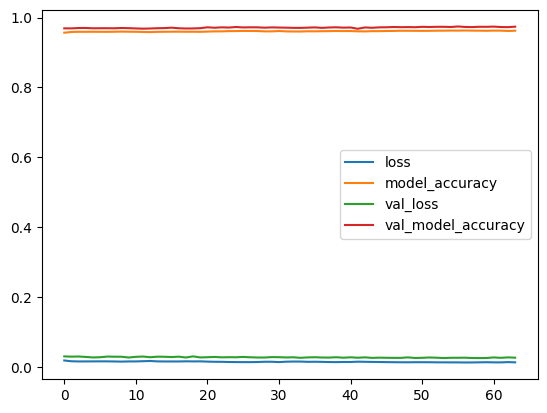

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

### **Fit 6**

In [ ]:
n=5
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - loss: 0.0132 - model_accuracy: 0.9624 - model_miou_score: 0.2950 - val_loss: 0.0253 - val_model_accuracy: 0.9738 - val_model_miou_score: 0.3479
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - loss: 0.0126 - model_accuracy: 0.9622 - model_miou_score: 0.2954 - val_loss: 0.0246 - val_model_accuracy: 0.9736 - val_model_miou_score: 0.3479
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - loss: 0.0130 - model_accuracy: 0.9621 - model_miou_score: 0.2952 - val_loss: 0.0245 - val_model_accuracy: 0.9744 - val_model_miou_score: 0.3478
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - loss: 0.0119 - model_accuracy: 0.9637 - model_miou_score: 0.2952 - val_loss: 0.0251 - val_model_accuracy: 0.9729 - val_model_miou_score: 0.3478
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - loss: 0.0127 - model_accuracy: 0.9620 - model_miou_score: 0.2952 - val_loss: 0.0259 - val_model_accuracy: 0.9741 - val_model_miou_score: 0.3479
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model6.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.012937,0.962111,0.250063,0.025287,0.973845,0.347916
1,0.012771,0.962384,0.250147,0.024614,0.973553,0.347925
2,0.012468,0.962762,0.250348,0.024466,0.974443,0.347845
3,0.012063,0.963506,0.250131,0.025117,0.972881,0.347829
4,0.012448,0.962728,0.250102,0.025880,0.974085,0.347855


<Axes: >

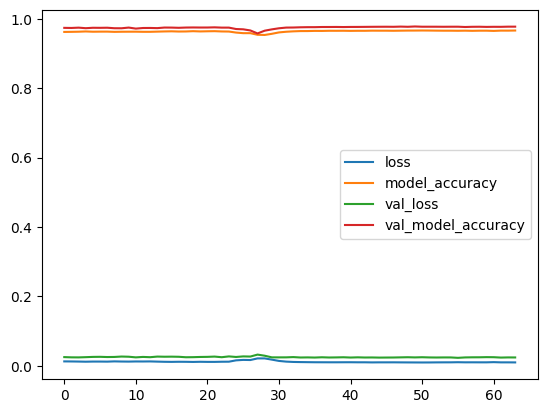

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

### **Fit 7**

In [ ]:
n=6
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - loss: 0.0129 - model_accuracy: 0.9639 - model_miou_score: 0.2950 - val_loss: 0.0245 - val_model_accuracy: 0.9770 - val_model_miou_score: 0.3484
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - loss: 0.0106 - model_accuracy: 0.9648 - model_miou_score: 0.2959 - val_loss: 0.0231 - val_model_accuracy: 0.9756 - val_model_miou_score: 0.3481
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - loss: 0.0109 - model_accuracy: 0.9644 - model_miou_score: 0.2955 - val_loss: 0.0242 - val_model_accuracy: 0.9771 - val_model_miou_score: 0.3481
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - loss: 0.0100 - model_accuracy: 0.9663 - model_miou_score: 0.2956 - val_loss: 0.0240 - val_model_accuracy: 0.9758 - val_model_miou_score: 0.3482
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - loss: 0.0108 - model_accuracy: 0.9648 - model_miou_score: 0.2957 - val_loss: 0.0249 - val_model_accuracy: 0.9771 - val_model_miou_score: 0.3479
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model7.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.011902,0.963604,0.250205,0.024457,0.977028,0.348390
1,0.010483,0.965275,0.250604,0.023104,0.975589,0.348089
2,0.010325,0.965584,0.250368,0.024169,0.977147,0.348073
3,0.010155,0.966108,0.250596,0.023953,0.975822,0.348157
4,0.010739,0.965080,0.250320,0.024949,0.977086,0.347914


<Axes: >

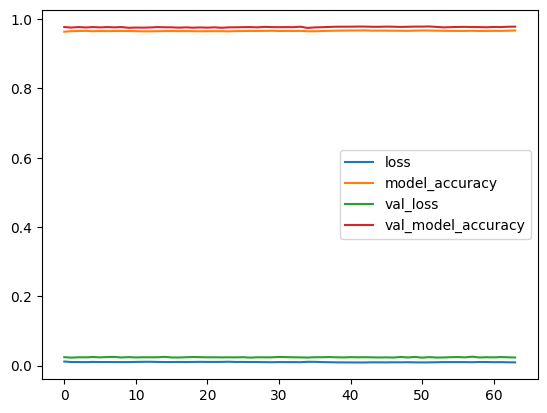

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

<Axes: >

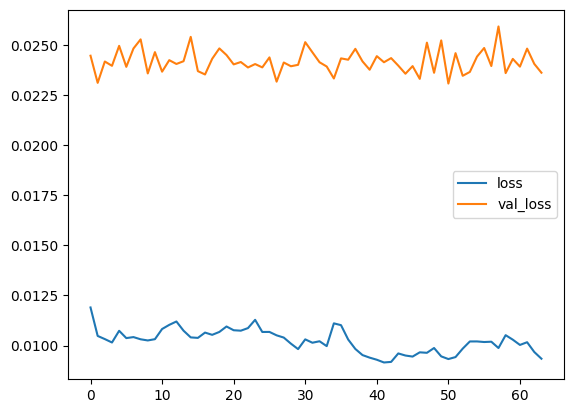

In [ ]:
res[['loss', 'val_loss']].plot()

<Axes: >

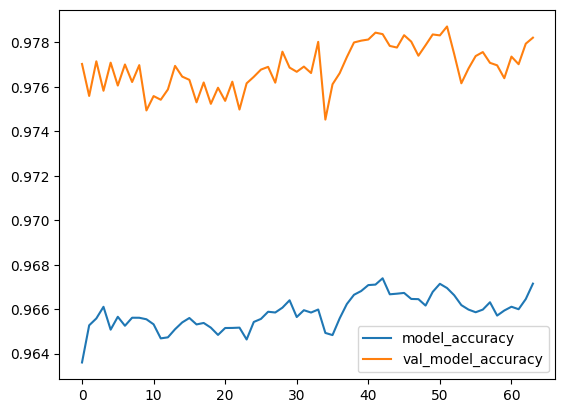

In [ ]:
res[[ 'model_accuracy','val_model_accuracy']].plot()

### **Fit 8**

In [ ]:
n=7
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - loss: 0.0099 - model_accuracy: 0.9666 - model_miou_score: 0.2954 - val_loss: 0.0220 - val_model_accuracy: 0.9784 - val_model_miou_score: 0.3481
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - loss: 0.0099 - model_accuracy: 0.9667 - model_miou_score: 0.2950 - val_loss: 0.0234 - val_model_accuracy: 0.9785 - val_model_miou_score: 0.3479
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.0091 - model_accuracy: 0.9676 - model_miou_score: 0.2950 - val_loss: 0.0235 - val_model_accuracy: 0.9787 - val_model_miou_score: 0.3483
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - loss: 0.0090 - model_accuracy: 0.9682 - model_miou_score: 0.2949 - val_loss: 0.0247 - val_model_accuracy: 0.9783 - val_model_miou_score: 0.3480
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - loss: 0.0097 - model_accuracy: 0.9671 - model_miou_score: 0.2950 - val_loss: 0.0236 - val_model_accuracy: 0.9778 - val_model_miou_score: 0.3479
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model8.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.009572,0.966930,0.250531,0.022009,0.978385,0.348074
1,0.009627,0.966826,0.250160,0.023354,0.978498,0.347933
2,0.009344,0.967096,0.250259,0.023478,0.978745,0.348265
3,0.009320,0.967327,0.250208,0.024704,0.978291,0.348014
4,0.009826,0.966540,0.250163,0.023577,0.977778,0.347921


<Axes: >

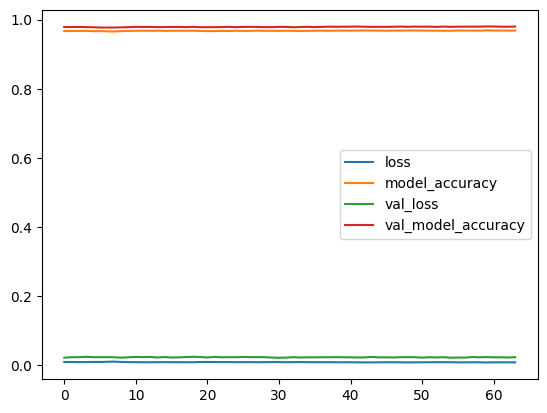

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

<Axes: >

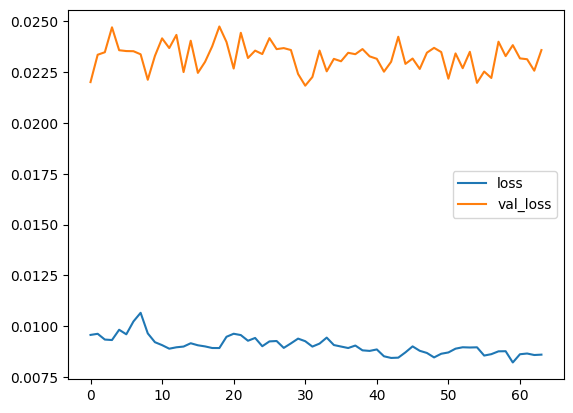

In [ ]:
res[['loss', 'val_loss']].plot()

<Axes: >

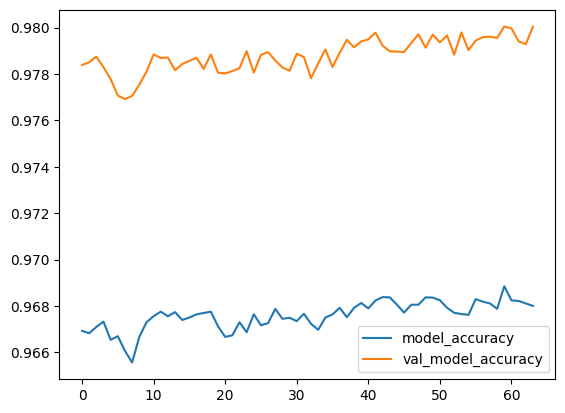

In [ ]:
res[[ 'model_accuracy','val_model_accuracy']].plot()

### **Fit 9**

In [ ]:
n=8
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
%%time
history = unet_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=64,
    verbose=1
)

Epoch 1/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - loss: 0.0089 - model_accuracy: 0.9679 - model_miou_score: 0.2954 - val_loss: 0.0232 - val_model_accuracy: 0.9800 - val_model_miou_score: 0.3480
Epoch 2/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - loss: 0.0087 - model_accuracy: 0.9683 - model_miou_score: 0.2952 - val_loss: 0.0226 - val_model_accuracy: 0.9800 - val_model_miou_score: 0.3480
Epoch 3/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - loss: 0.0084 - model_accuracy: 0.9687 - model_miou_score: 0.2951 - val_loss: 0.0234 - val_model_accuracy: 0.9799 - val_model_miou_score: 0.3482
Epoch 4/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - loss: 0.0082 - model_accuracy: 0.9689 - model_miou_score: 0.2953 - val_loss: 0.0228 - val_model_accuracy: 0.9797 - val_model_miou_score: 0.3481
Epoch 5/64
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - loss: 0.0084 - model_accuracy: 0.9687 - model_miou_score: 0.2952 - val_loss: 0.0234 - val_model_accuracy: 0.9799 - val_model_miou_score: 0.3479
Epoch 6/64
37/37 ━━

In [ ]:
unet_model.save('/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model9.keras')

In [ ]:
res = pd.DataFrame(unet_model.history.history)
res.head()

,loss,model_accuracy,model_miou_score,val_loss,val_model_accuracy,val_model_miou_score
0,0.008635,0.968235,0.250226,0.023238,0.979993,0.347963
1,0.008484,0.968510,0.250275,0.022632,0.980013,0.348031
2,0.008416,0.968601,0.250172,0.023393,0.979937,0.348150
3,0.008368,0.968740,0.250305,0.022812,0.979745,0.348134
4,0.008379,0.968698,0.250211,0.023406,0.979853,0.347938


<Axes: >

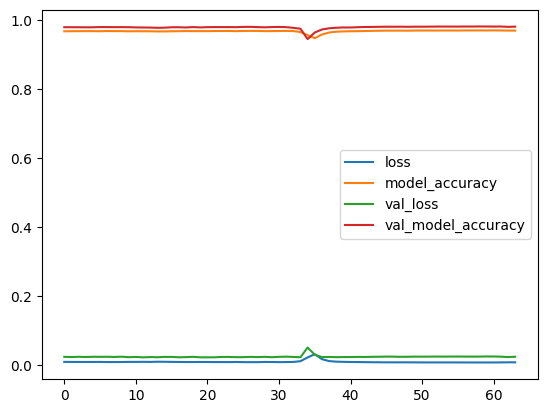

In [ ]:
res[['loss', 'model_accuracy', 'val_loss','val_model_accuracy']].plot()

<Axes: >

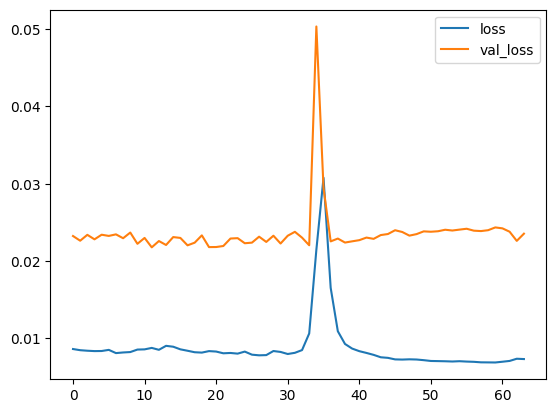

In [ ]:
res[['loss', 'val_loss']].plot()

<Axes: >

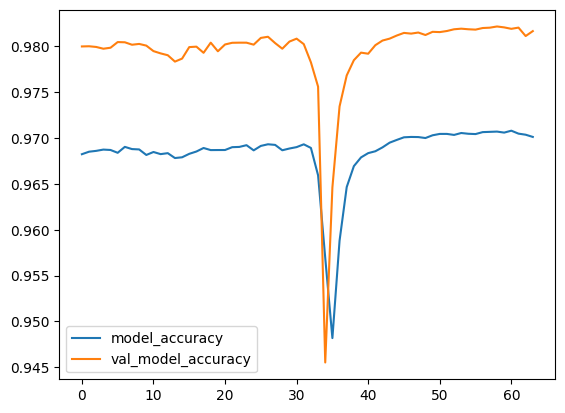

In [ ]:
res[[ 'model_accuracy','val_model_accuracy']].plot()

## **Evaluate the model on validation and training sets**

In [ ]:
n=9
unet_model.load_weights(f'/content/gdrive/MyDrive/CMP_FACADE/models/canny_unet_model{n}.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 202 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


### **Fit 9**

#### Training Evaluation

In [ ]:
results = unet_model.evaluate(train_generator)
print(results)

# Access individual metrics from the results based on their index
train_loss = results[0]  # Assuming loss is the first value
train_accuracy = results[1] # Assuming accuracy is the second value
train_miou = results[2] # Assuming miou is the third value
train_precision=results[3] # Assuming precision is the fourth value
train_recall=results[4] # Assuming recall is the fifth value
train_f1_score=results[5] # Assuming f1-score is the sixth value

print(f'Training Loss: {train_loss}')
print(f'Training Accuracy: {train_accuracy}')
print(f'Training mIoU: {train_miou}')
print(f'Training Precision: {train_precision}')
print(f'Training Recall: {train_recall}')
print(f'Training F1-Score: {train_f1_score}')

30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 563ms/step - calculate_f1_score: 0.9271 - calculate_miou: 0.8654 - calculate_precision: 0.9364 - calculate_recall: 0.9184 - loss: 0.0217 - model_accuracy: 0.9687
[0.01586502231657505, 0.9693622589111328, 0.8735244870185852, 0.9390037655830383, 0.9251466989517212, 0.9317839741706848]
Training Loss: 0.01586502231657505
Training Accuracy: 0.9693622589111328
Training mIoU: 0.8735244870185852
Training Precision: 0.9390037655830383
Training Recall: 0.9251466989517212
Training F1-Score: 0.9317839741706848


#### Validation Evaluation

In [ ]:
results = unet_model.evaluate(validation_generator)
print(results)

# Access individual metrics from the results based on their index
val_loss = results[0]  # Assuming loss is the first value
val_accuracy = results[1] # Assuming accuracy is the second value
val_miou = results[2] # Assuming miou is the third value
val_precision=results[3] # Assuming precision is the fourth value
val_recall=results[4] # Assuming recall is the fifth value
val_f1_score=results[5] # Assuming f1-score is the sixth value

print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')
print(f'Validation mIoU: {val_miou}')
print(f'Validation Precision: {val_precision}')
print(f'Validation Recall: {val_recall}')
print(f'Validation F1-Score: {val_f1_score}')

7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 352ms/step - calculate_f1_score: 0.9279 - calculate_miou: 0.8671 - calculate_precision: 0.9436 - calculate_recall: 0.9141 - loss: 0.0256 - model_accuracy: 0.9816
[0.02354101836681366, 0.9816656708717346, 0.8717527389526367, 0.94287109375, 0.9200236201286316, 0.93065345287323]
Validation Loss: 0.02354101836681366
Validation Accuracy: 0.9816656708717346
Validation mIoU: 0.8717527389526367
Validation Precision: 0.94287109375
Validation Recall: 0.9200236201286316
Validation F1-Score: 0.93065345287323


## **Predictions**

### **Fit 9**

####Training Set

In [ ]:
X_train = X_train.astype(np.float32)
y_pred_train = unet_model.predict(X_train)
y_pred_train_thresholded = (y_pred_train > 0.5).astype(np.uint8).astype(np.float32)
y_train_thresholded = (y_train > 0.5).astype(np.uint8).astype(np.float32)

16/16 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step


####Validation Set

In [ ]:
X_val = X_val.astype(np.float32)
y_pred_val = unet_model.predict(X_val)
y_pred_val_thresholded = (y_pred_val > 0.5).astype(np.uint8).astype(np.float32)
y_val_thresholded = (y_val > 0.5).astype(np.uint8).astype(np.float32)

4/4 ━━━━━━━━━━━━━━━━━━━━ 39s 13s/step


## **Function to plot predictions and ground truth**

In [ ]:
def plot_predictions(X, y_true, y_pred, num_samples=5, title_prefix=''):
    # y_pred = (y_pred * 255).astype(np.uint8)
    y_pred_max = tf.one_hot(tf.argmax(y_pred, axis=-1), depth=y_pred.shape[-1])
    # X = (X * 255).astype(np.uint8)
    # y_true = (y_true * 255).astype(np.uint8)
    plt.figure(figsize=(20, num_samples * 4))
    for i in range(num_samples):
        idx = np.random.randint(0, X.shape[0])
        y_pred_image=binary_masks_to_rgb(y_pred_max[idx].numpy())
        y_true_image=binary_masks_to_rgb(y_true[idx])
        # Original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(cv2.cvtColor(rgb_and_canny_image_split(X[idx].astype(np.uint8)), cv2.COLOR_BGR2RGB))
        plt.title(f'{title_prefix} Original with Canny Edge Image')

        # Ground truth mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(y_true_image)
        plt.title(f'{title_prefix} Ground Truth Mask')

        # Predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(y_pred_image)
        plt.title(f'{title_prefix} Predicted Mask')

    plt.tight_layout()
    plt.show()

## **Plot Predictions**

### **Fit 9**

#### Training

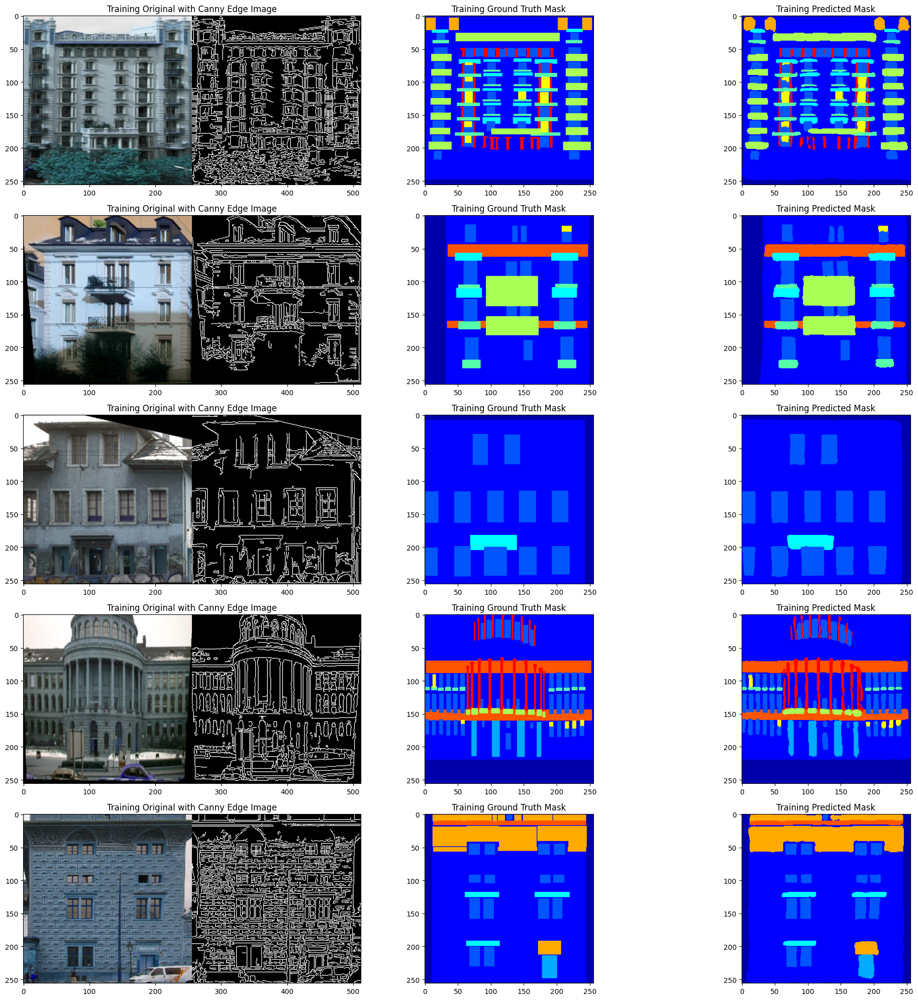

In [ ]:
plot_predictions(X_train, y_train, y_pred_train, num_samples=5, title_prefix='Training')

#### Validation

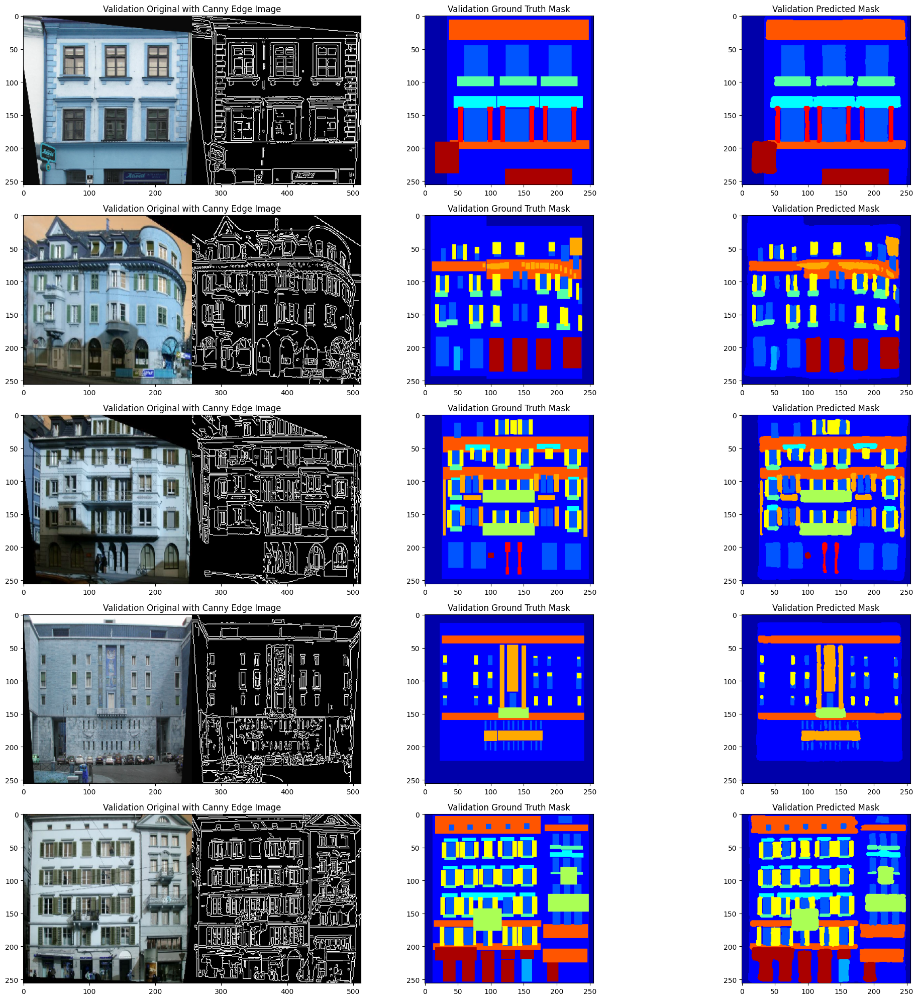

In [ ]:
plot_predictions(X_val, y_val, y_pred_val, num_samples=5, title_prefix='Validation')

# **Labelling**

## With Original images and predicted masks

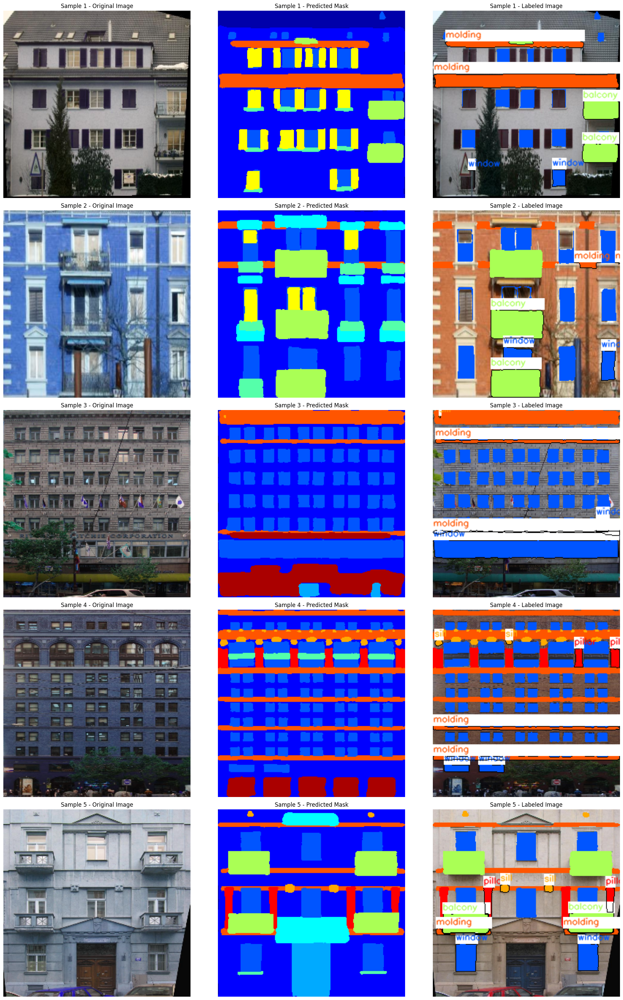

In [ ]:
# Load all original images and predicted masks
original_img_paths = image_paths

# Define color codes for labels (BGR format for OpenCV)
color_codes = {
    "window": (255, 85, 0),    # Blue
    "balcony": (85, 255, 170),  # Light Green
    "pillar": (0, 0, 255),      # Red
    "molding": (0, 85, 255),    #Dark Orange
    "sill": (0, 170, 255)       # Orange
}

# Function to overlay predicted masks on the original image
def overlay_predicted_masks(original_img, mask_img, color_codes):
    original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    labeled_img = original_img_rgb.copy()

    # Resize both original and mask images to 256x256 for uniformity
    original_img_resized = cv2.resize(original_img_rgb, (256, 256))
    mask_img_resized = cv2.resize(mask_img, (256, 256))

    # Create a color mapping from mask to color for visualization
    for label, color in color_codes.items():
        # Create a mask for the current label
        current_mask = cv2.inRange(mask_img_resized, np.array(color), np.array(color))

        # Overlay the mask on the resized original image
        original_img_resized[current_mask > 0] = color  # Assign the color where the mask is

    return original_img_resized, mask_img_resized

# Function to add contours and labels, showing only up to 2 instances of each label
def add_contours_and_labels(labeled_img, mask_img, color_codes):
    font_scale = 0.4  # Reduced font scale for readability
    font_thickness = 1  # Set a reasonable thickness for the label text

    # Track how many times each label has been placed
    label_count = {label: 0 for label in color_codes.keys()}

    for label, color in color_codes.items():
        # Create a mask for the current label to find its position
        current_mask = cv2.inRange(mask_img, np.array(color), np.array(color))

        # Find contours on the current mask
        contours, _ = cv2.findContours(current_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Process contours but only display 2 instances of each label
        displayed_count = 0
        for contour in contours:
            if len(contour) > 0 and displayed_count < 2:
                # Get the bounding rectangle around the contour
                x, y, w, h = cv2.boundingRect(contour)
                text_position = (x, y - 5 if y > 5 else y + 5)  # Adjust text position slightly above the region

                # Draw the contour
                cv2.drawContours(labeled_img, [contour], -1, (0, 0, 0), 1)

                # Draw a white rectangle as a background for the label
                cv2.rectangle(labeled_img, (x, y - 15), (x + w, y), (255, 255, 255), -1)

                # Place the label text in the color of the region, with a white background
                cv2.putText(labeled_img, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, font_thickness, cv2.LINE_AA)

                # Increment the count of this label
                displayed_count += 1

        # Ensure a maximum of 2 instances are displayed for each label
        label_count[label] += displayed_count

    return labeled_img

# Plotting results for multiple samples
num_samples = 5  # Set the number of samples to plot
plt.figure(figsize=(20, 6 * num_samples))  # Adjust figure size to accommodate original, mask, and labeled images

for i in range(min(num_samples, len(X_val))):
    # Load original image and mask
    original_img = X_val[i].astype(np.uint8)
    y_pred_max = tf.one_hot(tf.argmax(y_pred_val, axis=-1), depth=y_pred_val.shape[-1])
    y_pred_image = binary_masks_to_rgb(y_pred_max[i].numpy())

    # Convert to BGR for OpenCV processing
    y_pred_image_bgr = cv2.cvtColor(y_pred_image, cv2.COLOR_RGB2BGR)

    # Check if images are loaded correctly
    if original_img is None:
        raise ValueError(f"Original image not loaded. Check the path: {original_img_paths[i]}")

    # Overlay the predicted masks on the original image and resize them
    labeled_img, resized_mask_img = overlay_predicted_masks(original_img, y_pred_image_bgr, color_codes)

    # Add contours and labels above the colored regions in the labeled image, limiting to 2 per label
    labeled_img_with_contours = add_contours_and_labels(labeled_img.copy(), resized_mask_img, color_codes)

    # Plot the original image
    plt.subplot(num_samples, 3, i * 3 + 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))  # Convert to RGB for plotting
    plt.title(f"Sample {i + 1} - Original Image")
    plt.axis('off')

    # Plot the predicted mask image
    plt.subplot(num_samples, 3, i * 3 + 2)
    plt.imshow(cv2.cvtColor(y_pred_image_bgr, cv2.COLOR_BGR2RGB))  # Convert to RGB for plotting
    plt.title(f"Sample {i + 1} - Predicted Mask")
    plt.axis('off')

    # Plot the labeled image with contours
    plt.subplot(num_samples, 3, i * 3 + 3)
    plt.imshow(cv2.cvtColor(labeled_img_with_contours, cv2.COLOR_BGR2RGB))  # Convert to RGB for plotting
    plt.title(f"Sample {i + 1} - Labeled Image")
    plt.axis('off')

# Show the plots
plt.tight_layout()
plt.show()
